The first step to any exploratory data analysis is the selection of a dataset. For our analysis, we have chosen the viewership and streaming data for 'Twitch', the world's largest game streaming platform.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [2]:
# Specify the appropriate encoding (e.g., 'latin1' or 'ISO-8859-1')
twitch_game_data = pd.read_csv('Twitch_game_data.csv', encoding='latin1')

# Print the first few rows
print(twitch_game_data.head())

   Rank                              Game  Month  Year  Hours_watched  \
0     1                 League of Legends      1  2016       94377226   
1     2  Counter-Strike: Global Offensive      1  2016       47832863   
2     3                            Dota 2      1  2016       45185893   
3     4                       Hearthstone      1  2016       39936159   
4     5       Call of Duty: Black Ops III      1  2016       16153057   

   Hours_streamed  Peak_viewers  Peak_channels  Streamers  Avg_viewers  \
0         1362044        530270           2903     129172       127021   
1          830105        372654           2197     120849        64378   
2          433397        315083           1100      44074        60815   
3          235903        131357            517      36170        53749   
4         1151578         71639           3620     214054        21740   

   Avg_channels  Avg_viewer_ratio  
0          1833             69.29  
1          1117             57.62  
2       

Certain data cleaning operations need to be performed on the base dataset to make it more readable and increase it's usability.

In [3]:
#Data Cleaning and Keeping only top 100 ranks for each month
twitch_game_data = twitch_game_data[twitch_game_data['Rank'] <= 100]
print(twitch_game_data)

#Drop Null values
twitch_game_data = twitch_game_data.dropna()
twitch_game_data.isnull().sum()

special_characters = twitch_game_data[twitch_game_data['Game'].str.contains(r'[^\x00-\x7F]+')]
special_characters

#Create a for loop to Replace PokÃ©mon with Pokemon
for i in range(len(twitch_game_data)):
    twitch_game_data['Game'].iloc[i] = twitch_game_data['Game'].iloc[i].replace('PokÃ©mon', 'Pokemon')

#Create a for loop to Replace RagnarÃ¶k with Ragnarok
for i in range(len(twitch_game_data)):
    twitch_game_data['Game'].iloc[i] = twitch_game_data['Game'].iloc[i].replace('RagnarÃ¶k', 'Ragnarok')

#Remove Just Chatting from the data
twitch_game_data = twitch_game_data[twitch_game_data['Game'] != 'Just Chatting']

#Remove Special Events from the data
twitch_game_data = twitch_game_data[twitch_game_data['Game'] != 'Special Events']

      Rank                                               Game  Month  Year  \
0        1                                  League of Legends      1  2016   
1        2                   Counter-Strike: Global Offensive      1  2016   
2        3                                             Dota 2      1  2016   
3        4                                        Hearthstone      1  2016   
4        5                        Call of Duty: Black Ops III      1  2016   
...    ...                                                ...    ...   ...   
9295    96                                      7 Days to Die      9  2023   
9296    97                                  World of Warships      9  2023   
9297    98                                         The Sims 4      9  2023   
9298    99  Heroes of Might and Magic III: The Restoration...      9  2023   
9299   100                               The First Descendant      9  2023   

      Hours_watched  Hours_streamed  Peak_viewers  Peak_channel

/var/folders/8x/q63_md3x2tv7wn9wj83zxb0m0000gn/T/ipykernel_66842/2551326761.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  twitch_game_data['Game'].iloc[i] = twitch_game_data['Game'].iloc[i].replace('PokÃ©mon', 'Pokemon')
/var/folders/8x/q63_md3x2tv7wn9wj83zxb0m0000gn/T/ipykernel_66842/2551326761.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  twitch_game_data['Game'].iloc[i] = twitch_game_data['Game'].iloc[i].replace('PokÃ©mon', 'Pokemon')
/var/folders/8x/q63_md3x2tv7wn9wj83zxb0m0000gn/T/ipykernel_66842/2551326761.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFr

In [4]:
# Descriptive statistics of the dataset
# This provides summary statistics for numerical columns
descriptive_stats = twitch_game_data.describe()
print(descriptive_stats)

              Rank        Month         Year  Hours_watched  Hours_streamed  \
count  9183.000000  9183.000000  9183.000000   9.183000e+03    9.183000e+03   
mean     50.904497     6.351628  2019.369596   9.346382e+06    3.166075e+05   
std      28.712698     3.406107     2.241118   2.023202e+07    7.420165e+05   
min       1.000000     1.000000  2016.000000   2.417680e+05    1.230000e+02   
25%      26.000000     3.000000  2017.000000   1.269583e+06    3.507100e+04   
50%      51.000000     6.000000  2019.000000   2.762696e+06    8.839900e+04   
75%      76.000000     9.000000  2021.000000   6.507087e+06    2.300555e+05   
max     100.000000    12.000000  2023.000000   3.445520e+08    1.024570e+07   

       Peak_viewers  Peak_channels     Streamers    Avg_viewers  Avg_channels  \
count  9.183000e+03    9183.000000  9.183000e+03    9183.000000   9183.000000   
mean   9.121203e+04    1153.755635  3.691751e+04   12821.344005    433.847653   
std    1.694703e+05    3634.820301  8.400260e

In [5]:
# Total hours streamed for top 10 games in descending order
top_10_games_streamed = twitch_game_data.groupby('Game')['Hours_streamed'].sum().sort_values(ascending=False).head(10)
print(top_10_games_streamed)

Game
Fortnite                            382065012
League of Legends                   195677443
Apex Legends                        153747049
VALORANT                            140340258
Call of Duty: Warzone               128379086
Minecraft                           107219350
Grand Theft Auto V                  104498883
Counter-Strike: Global Offensive     80709385
World of Warcraft                    79131092
Dead by Daylight                     64976497
Name: Hours_streamed, dtype: int64


In [6]:
# Average number of viewers for top 10 games
average_viewership = twitch_game_data.groupby('Game')['Avg_viewers'].mean().sort_values(ascending=False).head(10)
print(average_viewership)

Game
League of Legends                   147281.989247
VALORANT                            122537.000000
Fortnite                            100524.733333
Grand Theft Auto V                   87926.107527
Counter-Strike                       72571.250000
Counter-Strike: Global Offensive     66604.696629
Call of Duty: Warzone                66177.060000
Dota 2                               58036.860215
Apex Legends                         57694.446429
Diablo IV                            52237.166667
Name: Avg_viewers, dtype: float64


In [7]:
# Genre with the highest peak viewers and the corresponding peak viewers and peak viewers ratio
max_peak_viewers_row = twitch_game_data.loc[twitch_game_data['Peak_viewers'].idxmax()]
max_peak_viewers_game = max_peak_viewers_row['Game']
max_peak_viewers_ratio = max_peak_viewers_row['Peak_viewers'] / max_peak_viewers_row['Avg_channels']

print(f"The game with the highest peak viewers is {max_peak_viewers_game} with {max_peak_viewers_row['Peak_viewers']} viewers and a peak viewers ratio of {max_peak_viewers_ratio:.2f}")


The game with the highest peak viewers is League of Legends with 3145012 viewers and a peak viewers ratio of 1221.36


In [8]:
# Games with the highest average viewers in each month and the number of streamers for these games
gameData = []
max_avg_viewers = []
streamers = []
yearData = []
monthData = []
for a in twitch_game_data['Year'].unique():
    yearly_game_data = twitch_game_data[twitch_game_data['Year'] == a]
    for b in yearly_game_data['Month'].unique():
        monthly_game_data = yearly_game_data[yearly_game_data['Month'] == b]
        max_avg_viewer_row = monthly_game_data.loc[monthly_game_data['Avg_viewers'].idxmax()]
        
        yearData.append(a)
        monthData.append(b)
        gameData.append(max_avg_viewer_row['Game'])
        max_avg_viewers.append(max_avg_viewer_row['Avg_viewers'])
        streamers.append(max_avg_viewer_row['Streamers'])

dataArr = pd.DataFrame( {'Year':yearData,
                         'Month':monthData,
                        'Game':gameData,
                        "Average Viewers":max_avg_viewers,
                        "Number of Streamers":streamers} )
pd.set_option('display.max_rows', 999)
dataArr


,Year,Month,Game,Average Viewers,Number of Streamers
0,2016,1,League of Legends,127021,129172
1,2016,2,League of Legends,134035,117996
2,2016,3,League of Legends,127206,117734
3,2016,4,League of Legends,122933,113251
4,2016,5,League of Legends,108585,118593
5,2016,6,League of Legends,113141,102620
6,2016,7,League of Legends,104807,105041
7,2016,8,League of Legends,109939,105795
8,2016,9,League of Legends,112746,110946
9,2016,10,League of Legends,140383,111071


In [9]:
# Year with the highest total hours watched and the corresponding total hours watched
max_hours_watched_year_row = twitch_game_data.groupby('Year')['Hours_watched'].sum().idxmax()
max_hours_watched_value = twitch_game_data.groupby('Year')['Hours_watched'].sum().max()

print(f"The year with the highest total hours watched is: {max_hours_watched_year_row} with a total of {max_hours_watched_value} hours")

The year with the highest total hours watched is: 2021 with a total of 17653847814 hours


In [10]:
# Identify the top 5 games with the highest average viewer ratio
top_avg_viewer_ratio_games = twitch_game_data.nlargest(5, 'Avg_viewer_ratio')[['Game', 'Avg_viewer_ratio']]
print(top_avg_viewer_ratio_games)

                                   Game  Avg_viewer_ratio
3039                 Doctor Who Pinball           4586.72
2931                 Doctor Who Pinball           4070.44
2282  Penn & Teller's Smoke and Mirrors           3695.19
1395            IMDb Live Viewing Party           3607.03
2236                    Twitch Presents           3418.93


In [11]:
# Analysis based on rank
# Game with the highest rank across all years
max_rank_row = twitch_game_data.loc[twitch_game_data['Rank'].idxmin()]
max_rank_game = max_rank_row['Game']

print(f"The game with the highest rank across all years is: {max_rank_game}")

The game with the highest rank across all years is: League of Legends


In [12]:
#top game with the highest rank across all years
top_ranked_game_by_year = twitch_game_data.groupby('Year').apply(lambda x: x.loc[x['Rank'].idxmin()])[['Rank','Game']]
print(top_ranked_game_by_year)

      Rank               Game
Year                         
2016     1  League of Legends
2017     1  League of Legends
2018     1  League of Legends
2019     1           Fortnite
2020     1  League of Legends
2021     2               Rust
2022     2  League of Legends
2023     2  League of Legends


In [13]:
#month with average viewership from highest to lowest
average_viewership_by_month = twitch_game_data.groupby('Month')['Avg_viewers'].mean().sort_values(ascending=False)
print(average_viewership_by_month)

Month
4     13753.087231
5     13421.506329
2     13072.107459
8     12998.274684
6     12952.726582
1     12803.581013
3     12703.587863
9     12665.074778
10    12623.210145
7     12538.484197
11    12288.063768
12    11815.305797
Name: Avg_viewers, dtype: float64


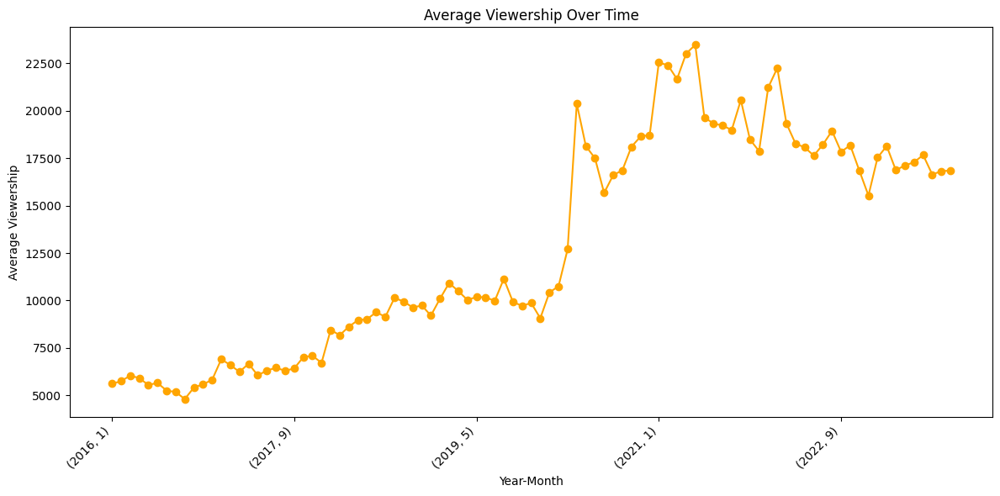

In [14]:
# Line chart for average viewership over time
plt.figure(figsize=(12, 6))
twitch_game_data.groupby(['Year', 'Month'])['Avg_viewers'].mean().plot(marker='o', linestyle='-', color='orange')

plt.title('Average Viewership Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Average Viewership')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

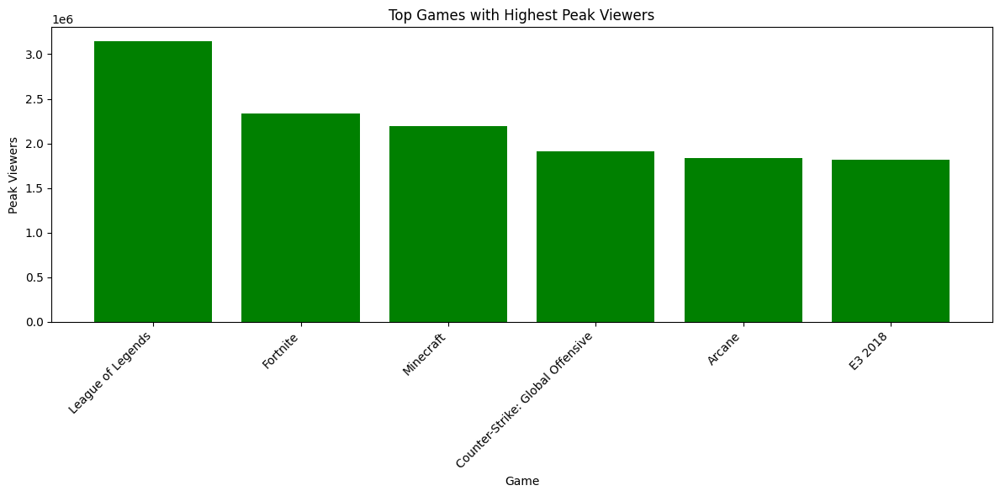

In [15]:
# Top games with highest peak viewers
top_peak_viewers_games = twitch_game_data.nlargest(10, 'Peak_viewers')

# Plotting the bar chart
plt.figure(figsize=(12, 6))
plt.bar(top_peak_viewers_games['Game'], top_peak_viewers_games['Peak_viewers'], color='green')

plt.title('Top Games with Highest Peak Viewers')
plt.xlabel('Game')
plt.ylabel('Peak Viewers')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

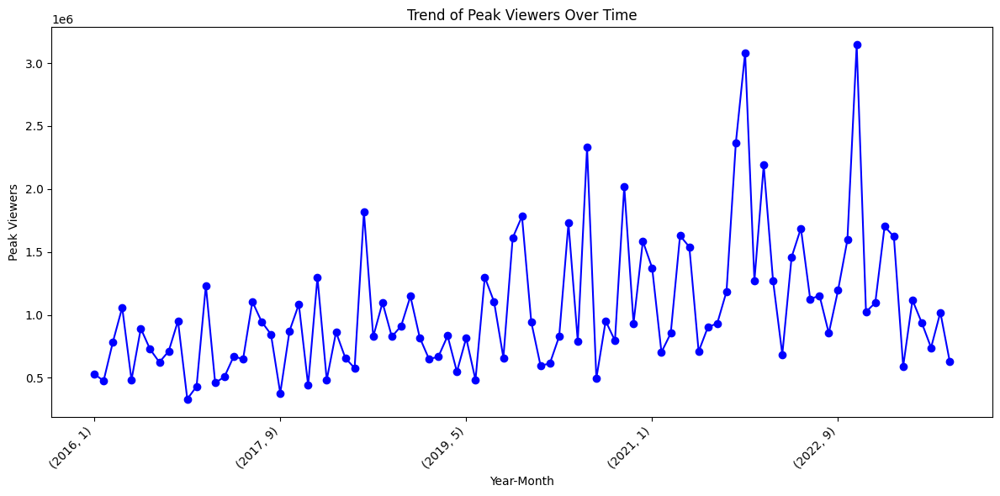

In [16]:
# Trend of Peak Viewers Over Time
plt.figure(figsize=(12, 6))
twitch_game_data.groupby(['Year', 'Month'])['Peak_viewers'].max().plot(marker='o', linestyle='-', color='blue')
plt.title('Trend of Peak Viewers Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Peak Viewers')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


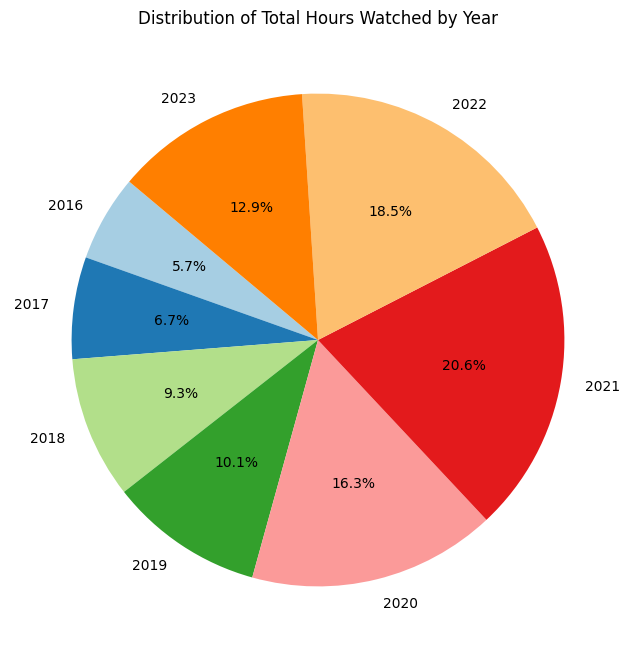

In [17]:
# Distribution of Total Hours Watched by Year
total_hours_by_year = twitch_game_data.groupby('Year')['Hours_watched'].sum()

plt.figure(figsize=(8, 8))
plt.pie(total_hours_by_year, labels=total_hours_by_year.index, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
plt.title('Distribution of Total Hours Watched by Year')
plt.show()

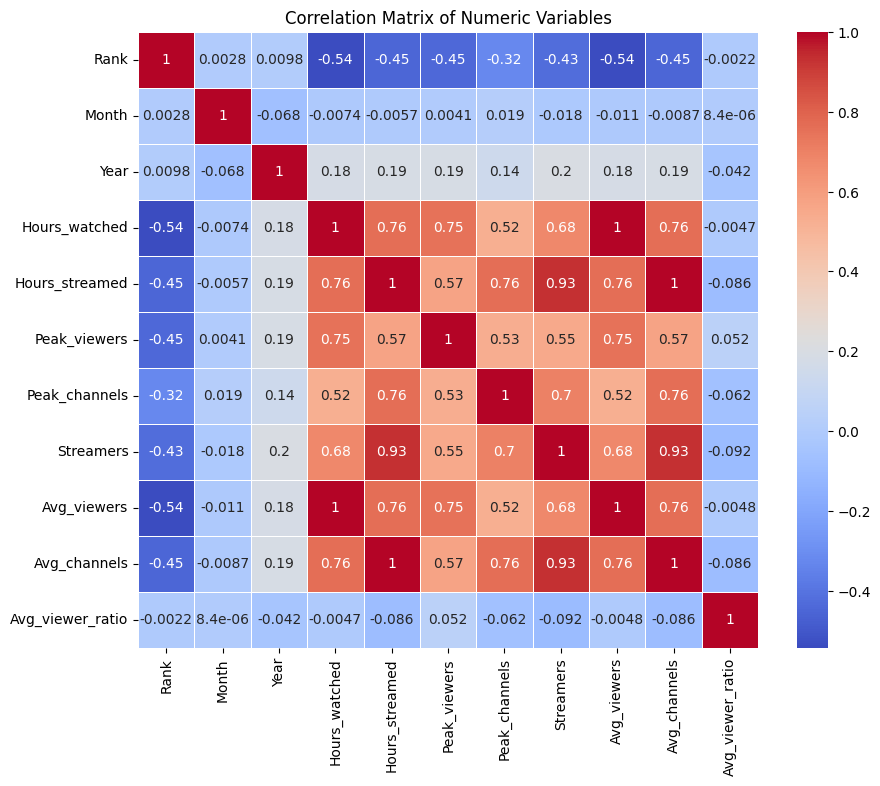

In [18]:
# Selecting numeric columns for the correlation matrix
numeric_columns = twitch_game_data.select_dtypes(include=['float64', 'int64']).columns

# Correlation Matrix Heatmap
correlation_matrix = twitch_game_data[numeric_columns].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Matrix of Numeric Variables')
plt.show()

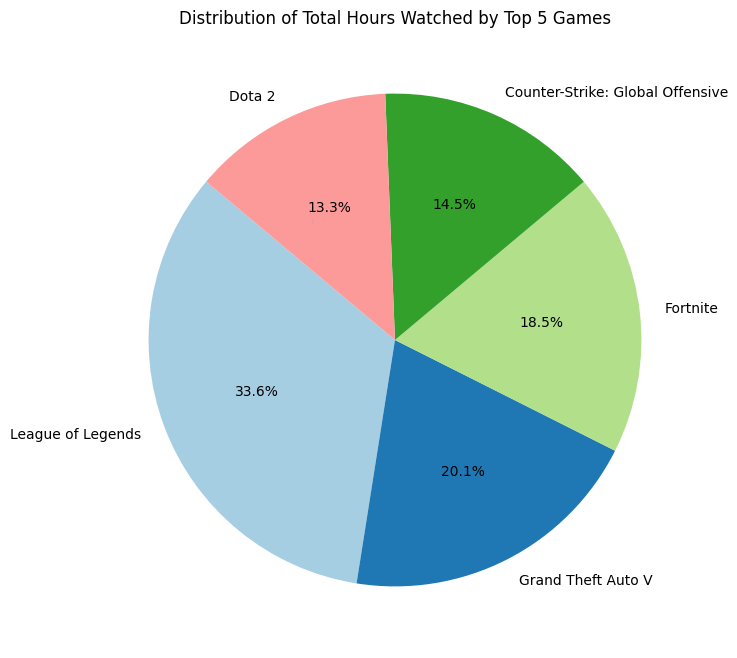

In [19]:
# Top 5 games by total hours watched across all years
top_5_games_overall = twitch_game_data.groupby('Game')['Hours_watched'].sum().nlargest(5).reset_index()

# Plotting the pie chart
plt.figure(figsize=(8, 8))
plt.pie(top_5_games_overall['Hours_watched'], labels=top_5_games_overall['Game'], autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
plt.title('Distribution of Total Hours Watched by Top 5 Games')
plt.show()

In [20]:
#Aggregate according to year
per_year_data = twitch_game_data.groupby(['Year','Month'])[['Hours_watched','Peak_viewers','Peak_channels','Streamers']].sum()
per_year_data.tail(25)


Hours_watched  Peak_viewers  Peak_channels  Streamers
Year Month                                                       
2021 9         1337960878      13393299         236623    4099255
     10        1497291342      15924636         150078    3884455
     11        1302667345      17895273         165571    3901997
     12        1301358354      14029296         221747    4003410
2022 1         1545491580      15399891         146784    7177666
     2         1463150245      14469752         185262    6695955
     3         1407678556      11534275         156051    6374180
     4         1287290062      13182046         124029    6013033
     5         1315935165      13306384         118436    5585669
     6         1242881798      11799622         164453    6066705
     7         1326406642      12428091         121460    6928563
     8         1379019704      13418624         167775    6638602
     9         1256890924      13051948         157522    5827026
     10        1323907980      12478218         146768    5810241
     11        1187012051      14864851         164118    5363656
     12        1130985579       9994546         189312    5741553
2023 1         1276909427      11206947         129954    6212004
     2         1192846767      15096116         184304    6081279
     3         1228642714      14800387         162531    6294033
     4         1206034977       9731588         137806    5855130
     5         1259010610      10482192         142062    5498985
     6         1244837764      10739082         147518    5907228
     7         1211782334       9550764         121966    6257169
     8         1224651250      12412493         153092    6201114
     9         1187204197      10648596         181626    5993638

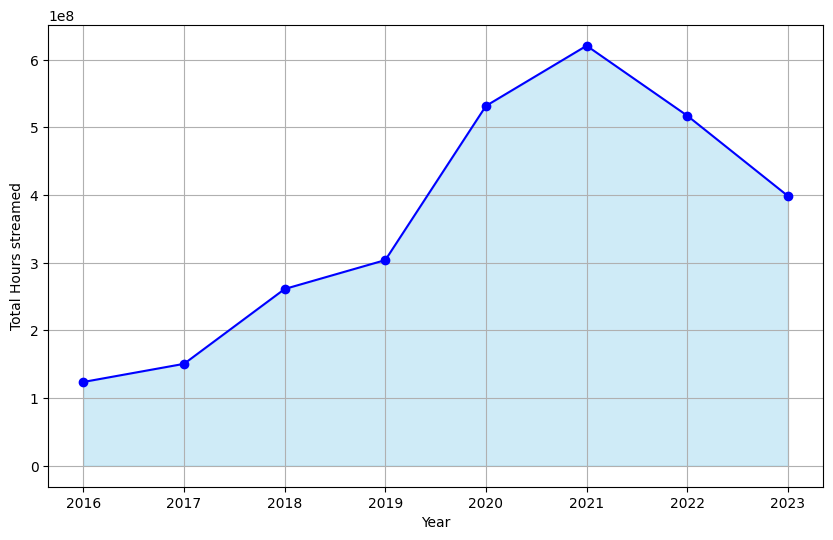

In [21]:
total_hours_by_year = twitch_game_data.groupby('Year')['Hours_streamed'].sum()

# Creating an area plot
plt.figure(figsize=(10, 6))
plt.fill_between(total_hours_by_year.index, total_hours_by_year, color='skyblue', alpha=0.4)
plt.plot(total_hours_by_year.index, total_hours_by_year, marker='o', color='b', linestyle='-')
plt.xlabel('Year')
plt.ylabel('Total Hours streamed')
plt.grid(True)
plt.show()

Mean Squared Error: 2372684377339.22
Root Mean Squared Error: 1540352.03
R-squared: 0.94
Coefficients: [ 5.17654807e+05 -1.11130812e+05  6.29552604e-03 -3.19579534e-01
 -1.53366957e-02 -2.15795772e+01  1.82447957e+02 -7.56651905e+05]
Intercept: -1018980267.4238849


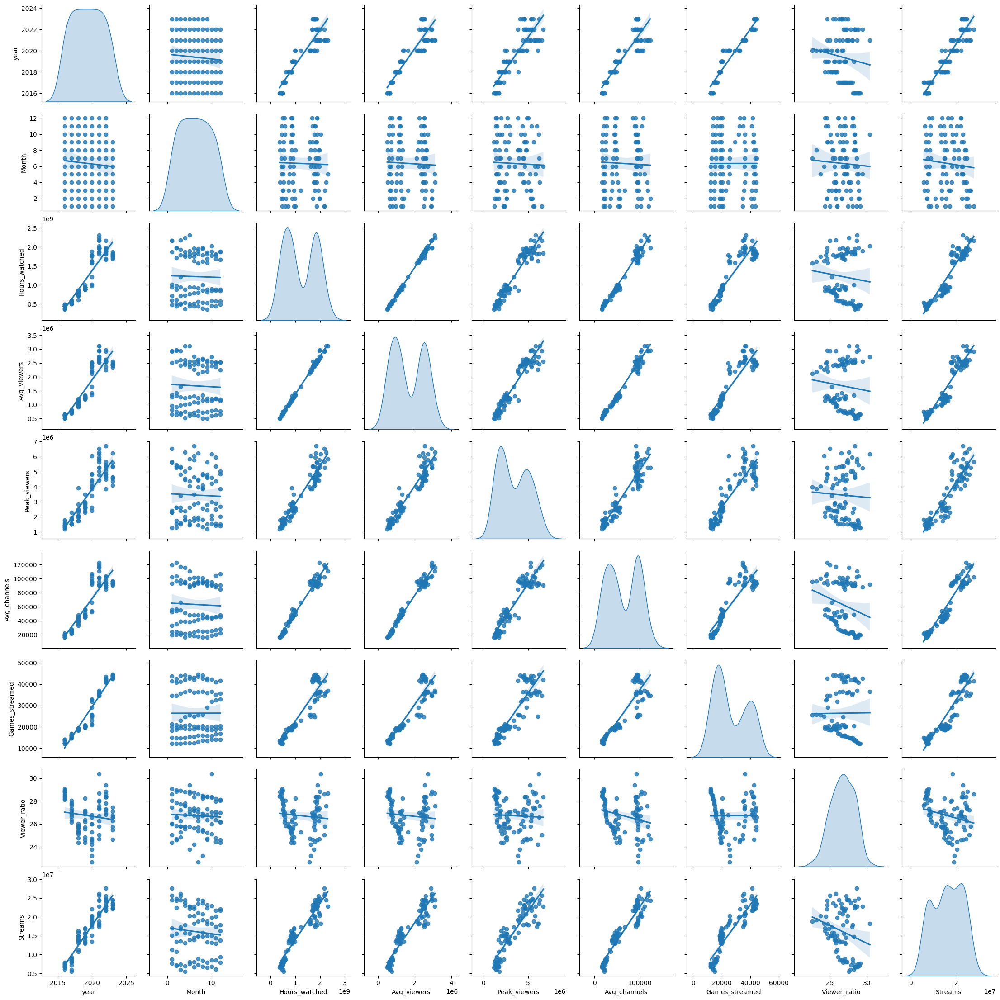

In [22]:

# Features (X) and Target variable (y)
twitch_global_data = pd.read_csv('Twitch_global_data.csv', encoding='latin1')

X = twitch_global_data.drop(['Streams'], axis=1)
y = twitch_global_data['Streams']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.2f}')
print(f'Root Mean Squared Error: {rmse:.2f}')
print(f'R-squared: {r2:.2f}')

# Print the coefficients and intercept
print('Coefficients:', model.coef_)
print('Intercept:', model.intercept_)

# Combine features and target variable into a single dataframe
data = pd.concat([X, y], axis=1)

# Create a pair plot with a regression line
sns.pairplot(data, kind="reg", diag_kind="kde")
plt.show()